# Mushshrooms common genus images classification models

In Mushrooms classification - Common genus's images data  of most common Northern European mushrooms genus inside of this dataset. Each folder consist of from 300 to 1500 selected images of mushrooms genuses. Labels are the folder's names.
* Dataset : https://www.kaggle.com/maysee/mushrooms-classification-common-genuss-images

# Genus
Data has 9 different mushroom genus:
* Agaricus
* Suillus
* Entoloma
* Hygrocybe
* Amanita
* Lactarius
* Russula
* Boletus
* Cortinarius

# Objective
Objective is to explore Common genus's images data of most common Northern European mushrooms genus,experiment with different data augmentation,sampling techniques and models, make mushsrooms image classifier model, for dataset cleaning, to find images  that has biggest error and maybe are not suitible for  modelling

In [1]:
from fastai.vision.all import *
from pathlib import Path
import shutil
from shutil import copy2
import os
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import timm
from fastai.vision.widgets import ImageClassifierCleaner

In [2]:
path = Path('/kaggle/working/')
pathv = Path('/kaggle/working/train_data')
patht = Path('/kaggle/working/train_data')

In [3]:
patht = Path('/kaggle/working/train_data/')
pathv = Path('/kaggle/working/val_data/')

In [4]:
data_dir = '/kaggle/input/mushrooms-classification-common-genuss-images/Mushrooms'

In [5]:
image_counts= {}
for category in os.listdir(data_dir):
    category_path =os.path.join(data_dir,category)
    if os.path.isdir(category_path):
        image_counts[category] = len(os.listdir(category_path))
        
for category, count in image_counts.items():
    print(f"{category}: {count} images")

Entoloma: 364 images
Suillus: 311 images
Hygrocybe: 316 images
Agaricus: 353 images
Amanita: 750 images
Lactarius: 1563 images
Russula: 1148 images
Boletus: 1073 images
Cortinarius: 836 images


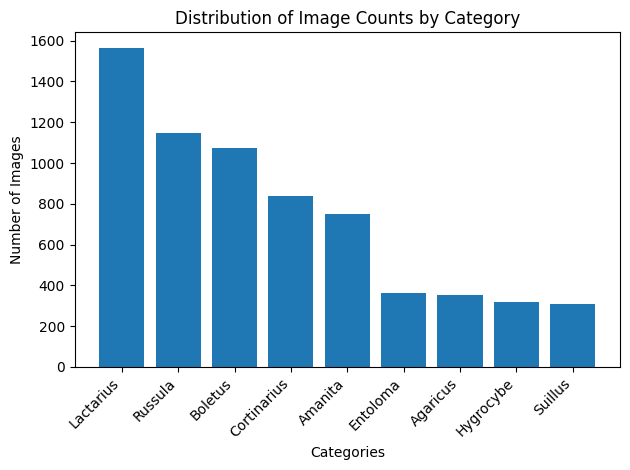

In [9]:
image_counts = {}

for category in os.listdir(data_dir):
    category_path = os.path.join(data_dir, category)
    if os.path.isdir(category_path):
        image_counts[category] = len(os.listdir(category_path))

sorted_image_counts = dict(sorted(image_counts.items(), key=lambda item: item[1], reverse=True))

sorted_categories = list(sorted_image_counts.keys())
sorted_counts = list(sorted_image_counts.values())

plt.bar(sorted_categories, sorted_counts)
plt.xlabel("Categories")
plt.ylabel("Number of Images")
plt.title("Distribution of Image Counts by Category")

plt.xticks(rotation=45, ha='right')

# Display the chart
plt.tight_layout()  
plt.show()

Our data are inbalanced

In [6]:
def print_resolution_stats(data_dir):
    """
    Prints maximum, minimum, and mean resolution for each subfolder in data_dir.

    Args:
        data_dir (str): Path to the directory containing image subfolders.
    """

    if not os.path.isdir(data_dir):
        print(f"Error: {data_dir} is not a valid directory.")
        return

    for subfolder in os.listdir(data_dir):
        if not os.path.isdir(os.path.join(data_dir, subfolder)):
            continue  # Skip non-directories

        max_width, max_height, min_width, min_height = 0, 0, float('inf'), float('inf')
        mean_width, mean_height, total_images = 0, 0, 0

        for filename in os.listdir(os.path.join(data_dir, subfolder)):
            if not filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                continue  

            try:
                with Image.open(os.path.join(data_dir, subfolder, filename)) as img:
                    width, height = img.size
                    max_width = max(max_width, width)
                    max_height = max(max_height, height)
                    min_width = min(min_width, width)
                    min_height = min(min_height, height)
                    mean_width += width
                    mean_height += height
                    total_images += 1
            except OSError:
                print(f"Warning: Could not open image {filename} in {subfolder}.")

        if total_images > 0:
            mean_width /= total_images
            mean_height /= total_images
            print(f"Subfolder: {subfolder}")
            print(f"Maximum resolution: {max_width}x{max_height}")
            print(f"Minimum resolution: {min_width}x{min_height}")
            print(f"Mean resolution: {mean_width:.2f}x{mean_height:.2f}")


In [7]:
print_resolution_stats(data_dir)

Subfolder: Entoloma
Maximum resolution: 1280x928
Minimum resolution: 259x182
Mean resolution: 788.30x563.38
Subfolder: Suillus
Maximum resolution: 1280x961
Minimum resolution: 259x176
Mean resolution: 790.03x570.32
Subfolder: Hygrocybe
Maximum resolution: 1200x931
Minimum resolution: 528x370
Mean resolution: 792.59x579.40
Subfolder: Agaricus
Maximum resolution: 1200x906
Minimum resolution: 423x282
Mean resolution: 785.13x571.84
Subfolder: Amanita
Maximum resolution: 1280x1024
Minimum resolution: 259x183
Mean resolution: 794.74x597.55
Subfolder: Lactarius
Maximum resolution: 1280x1024
Minimum resolution: 391x280
Mean resolution: 792.53x575.07
Subfolder: Russula
Maximum resolution: 1280x942
Minimum resolution: 259x194
Mean resolution: 793.97x566.37
Subfolder: Boletus
Maximum resolution: 1200x948
Minimum resolution: 262x192
Mean resolution: 809.27x594.11
Subfolder: Cortinarius
Maximum resolution: 1280x1024
Minimum resolution: 259x152
Mean resolution: 802.26x587.11


## Data split to train and validate sets 
85% of images goes to training set and 15% to validations et

In [8]:
data_paths = []
labels = []

for subdir, _, files in os.walk(data_dir):
    for file in files:
        if file.endswith((".jpg", ".jpeg", ".png")):
            path = os.path.join(subdir, file)
            label = os.path.basename(subdir)
            data_paths.append(path)
            labels.append(label)

train_paths, val_paths, train_labels, test_val_labels = train_test_split(data_paths, labels, test_size=0.15, stratify=labels, random_state=42)

for paths, folder in [(train_paths, "train_data"), (val_paths, "val_data")]:
    for path in paths:
        label = os.path.basename(os.path.dirname(path))
        dest_path = os.path.join(folder, label, os.path.basename(path))
        os.makedirs(os.path.dirname(dest_path), exist_ok=True)
        copy2(path, dest_path)

In [10]:
folders = ['train_data', 'val_data']
data_dir = './'  # Assuming the folders are in the same directory as this script

for folder in folders:
    folder_path = os.path.join(data_dir, folder)
    image_counts = {}
    for category in os.listdir(folder_path):
        category_path = os.path.join(folder_path, category)
        if os.path.isdir(category_path):
            image_counts[category] = len(os.listdir(category_path))

    print(f"Folder: {folder}")
    for category, count in image_counts.items():
        print(f"{category}: {count} images")
    print()

Folder: train_data
Boletus: 912 images
Entoloma: 309 images
Hygrocybe: 269 images
Agaricus: 300 images
Lactarius: 1328 images
Cortinarius: 711 images
Russula: 976 images
Amanita: 637 images
Suillus: 264 images

Folder: val_data
Boletus: 161 images
Entoloma: 55 images
Hygrocybe: 47 images
Agaricus: 53 images
Lactarius: 235 images
Cortinarius: 125 images
Russula: 172 images
Amanita: 113 images
Suillus: 47 images



## Verification of good images 

In [11]:
failed = verify_images(get_image_files(patht))
failed.map(Path.unlink)
len(failed)

1

In [12]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

0

In [13]:
failed = verify_images(get_image_files(pathv))
failed.map(Path.unlink)
len(failed)

0

# Test's which image tranformations  works best for this problem

* Different image transformations and then tests with resnet18 model
* Transformations techniques: Squich, zero pading , randomsized crop

In [14]:
data_dir = '/kaggle/working/'

In [15]:
mushrooms = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    #Data split
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    #Geting label
    get_y=parent_label,
    
    item_tfms=[Resize(224, method='squish')]
)

dls = mushrooms.dataloaders(source=data_dir, path=data_dir)

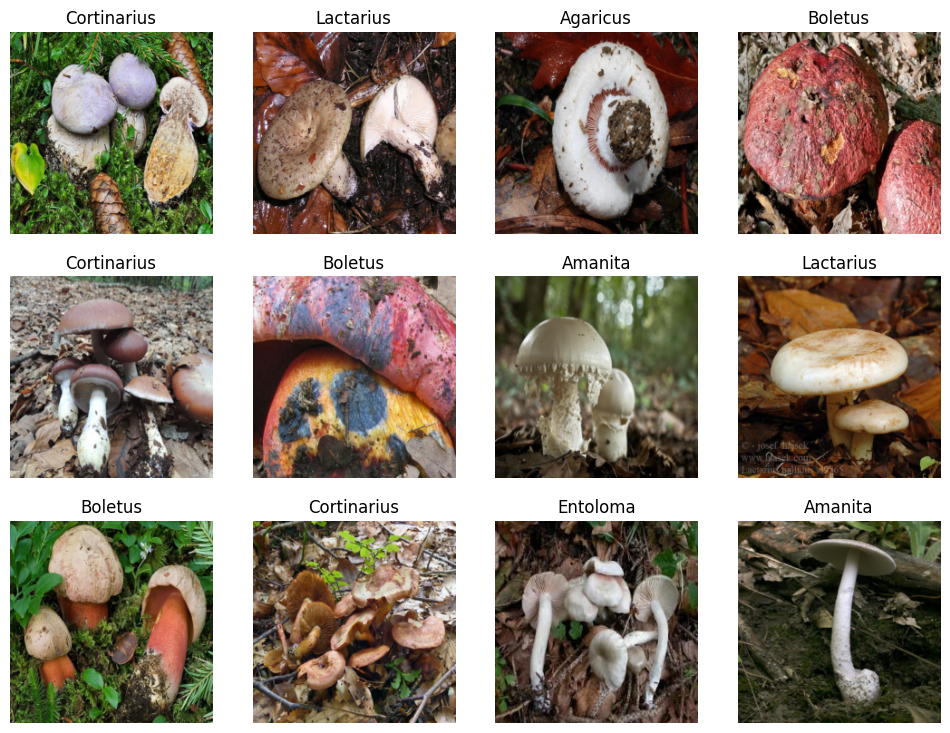

In [16]:
dls.show_batch(max_n=12)

In [17]:
Resnet18 = vision_learner(dls, resnet18, metrics=error_rate)

Resnet18.fine_tune(5)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 141MB/s] 


epoch,train_loss,valid_loss,error_rate,time
0,1.959295,1.083878,0.344262,00:32


epoch,train_loss,valid_loss,error_rate,time
0,1.070802,0.815681,0.269001,00:33
1,0.627353,0.749203,0.228763,00:33
2,0.294565,0.662853,0.210879,00:34
3,0.116794,0.666703,0.201937,00:34
4,0.053328,0.664934,0.207899,00:34


In [18]:
interp= ClassificationInterpretation.from_learner(Resnet18)

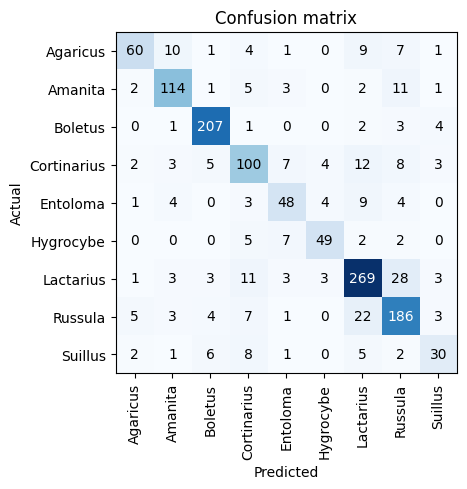

In [19]:
interp.plot_confusion_matrix()

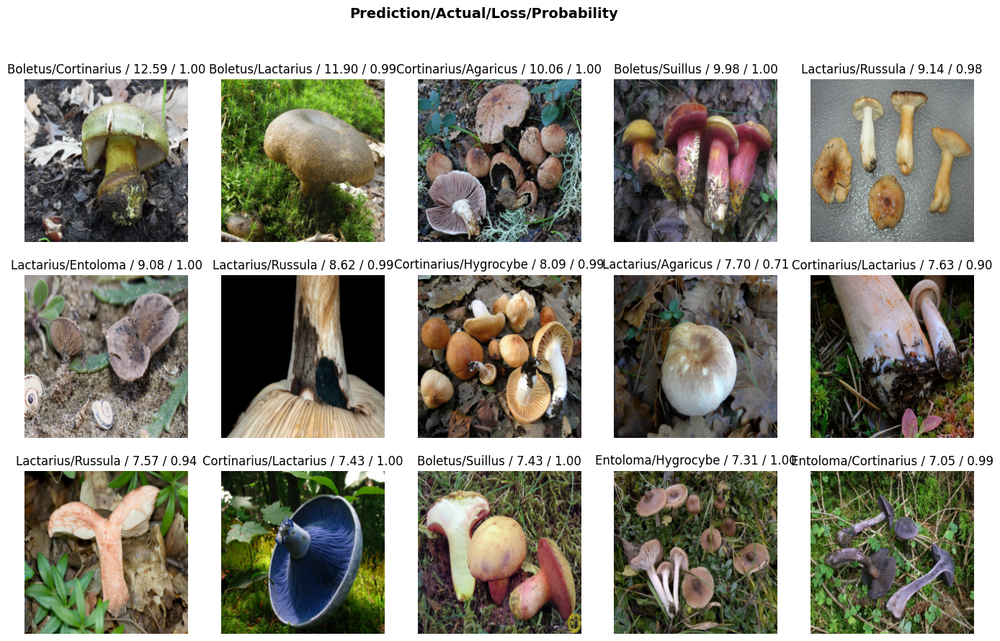

In [20]:
interp.plot_top_losses(15,figsize=(17,10))

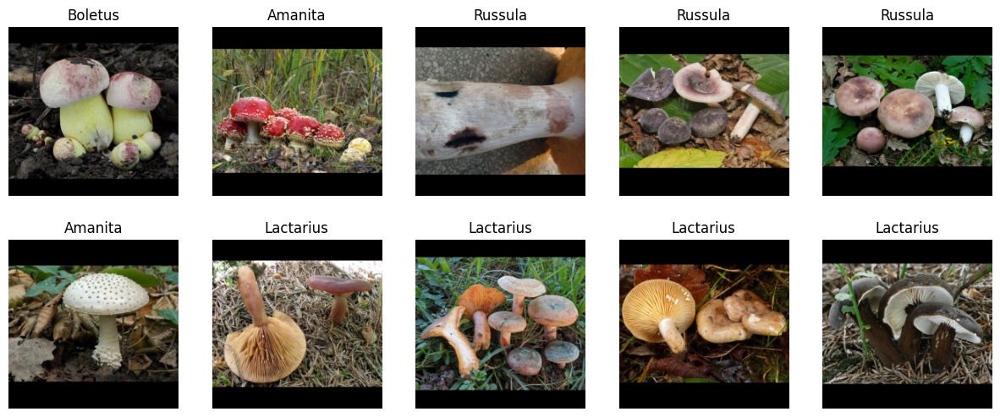

In [21]:
mushrooms = mushrooms.new(item_tfms=Resize(224, ResizeMethod.Pad, pad_mode='zeros'))
dls = mushrooms.dataloaders(source=data_dir, path=data_dir)
dls.valid.show_batch(max_n=10, nrows=2)
     

In [22]:
Resnet18_pad = vision_learner(dls, resnet18, metrics=error_rate)

Resnet18_pad.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,1.931572,1.112761,0.349478,00:33


epoch,train_loss,valid_loss,error_rate,time
0,1.120421,0.839623,0.278689,00:34
1,0.790429,0.804236,0.251863,00:33
2,0.441209,0.670632,0.201937,00:33
3,0.246336,0.635105,0.190015,00:33
4,0.157598,0.630920,0.190760,00:33


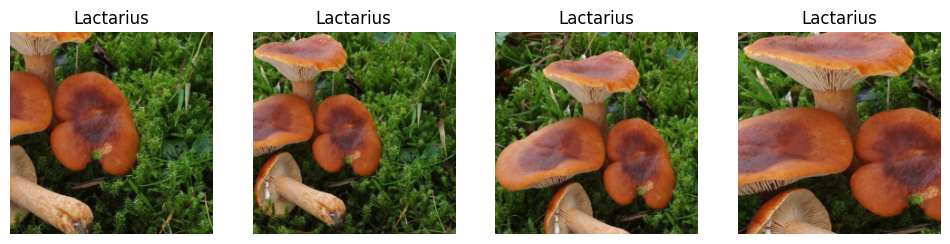

In [23]:
mushrooms = mushrooms.new(item_tfms=RandomResizedCrop(224, min_scale=0.2))
dls = mushrooms.dataloaders(source=data_dir, path=data_dir)
dls.show_batch(max_n=4, nrows=1,unique = True)

In [24]:
Resnet18_rcrop = vision_learner(dls, resnet18, metrics=error_rate)

Resnet18_rcrop.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,1.967205,1.055510,0.337556,00:24


epoch,train_loss,valid_loss,error_rate,time
0,1.214225,0.834001,0.269001,00:26
1,0.880553,0.648440,0.207899,00:25
2,0.647373,0.561877,0.187779,00:25
3,0.475549,0.490835,0.153502,00:26
4,0.406896,0.494284,0.153502,00:26


Data transformed with Random Sized Crop shows best results

#  Data augmentation and how it influence model performance

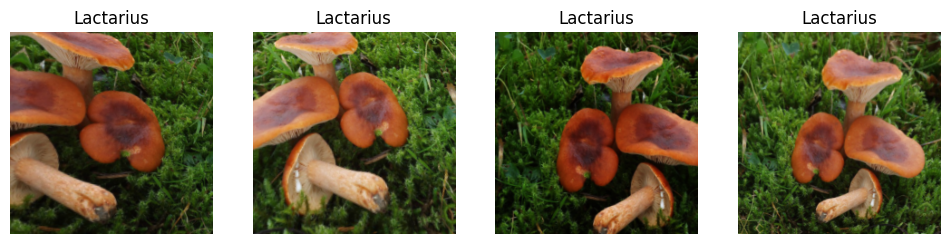

In [25]:
mushrooms = mushrooms.new(item_tfms=RandomResizedCrop(224, min_scale=0.5),batch_tfms=aug_transforms())
dls = mushrooms.dataloaders(source=data_dir, path=data_dir)
dls.show_batch(max_n=4, nrows=1,unique = True)

In [26]:
Resnet18_rcrop_aug = vision_learner(dls, resnet18, metrics=error_rate)

Resnet18_rcrop_aug.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,1.916823,1.109363,0.356185,00:29


epoch,train_loss,valid_loss,error_rate,time
0,1.218339,0.806659,0.252608,00:32
1,0.886906,0.639721,0.197466,00:31
2,0.636875,0.578153,0.172876,00:32
3,0.463611,0.514013,0.146051,00:32
4,0.376074,0.494477,0.150522,00:32


# Tests of how taking a stratified sample impacts image classifier performance


In [27]:
Mushrooms_strat=  DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,  
    splitter=GrandparentSplitter(train_name = "train_data", valid_name = "val_data"),  
    get_y=parent_label,  
    
    item_tfms=RandomResizedCrop(224, min_scale=0.2),
    
)

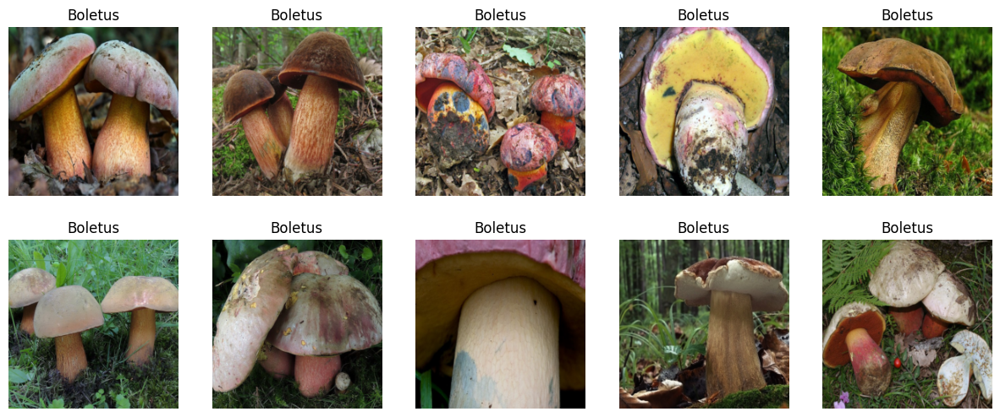

In [28]:
dls = Mushrooms_strat.dataloaders(source=data_dir, path=data_dir)
dls.valid.show_batch(max_n=10, nrows=2)

In [29]:
Resnet18_strat = vision_learner(dls, resnet18, metrics=error_rate)

Resnet18_strat.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,1.950623,1.049928,0.332341,00:29


epoch,train_loss,valid_loss,error_rate,time
0,1.195469,0.761814,0.246032,00:30
1,0.893884,0.605806,0.199405,00:30
2,0.636926,0.521004,0.169643,00:30
3,0.486499,0.465218,0.156746,00:30
4,0.399689,0.451433,0.149802,00:30


Stratified data with random size crop works best for resnet_18 model

Taking Stratified sample improved Resnet18 model performance

In [30]:
interp= ClassificationInterpretation.from_learner(Resnet18_strat)

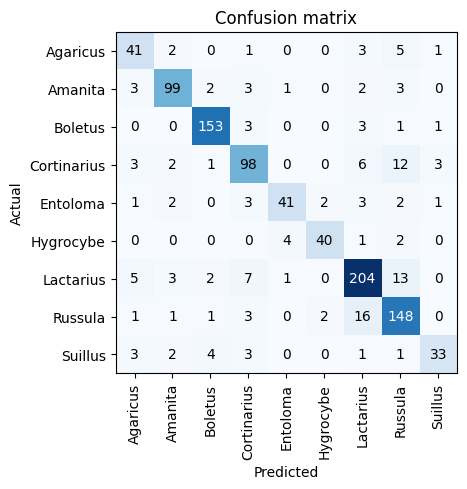

In [31]:
interp.plot_confusion_matrix()

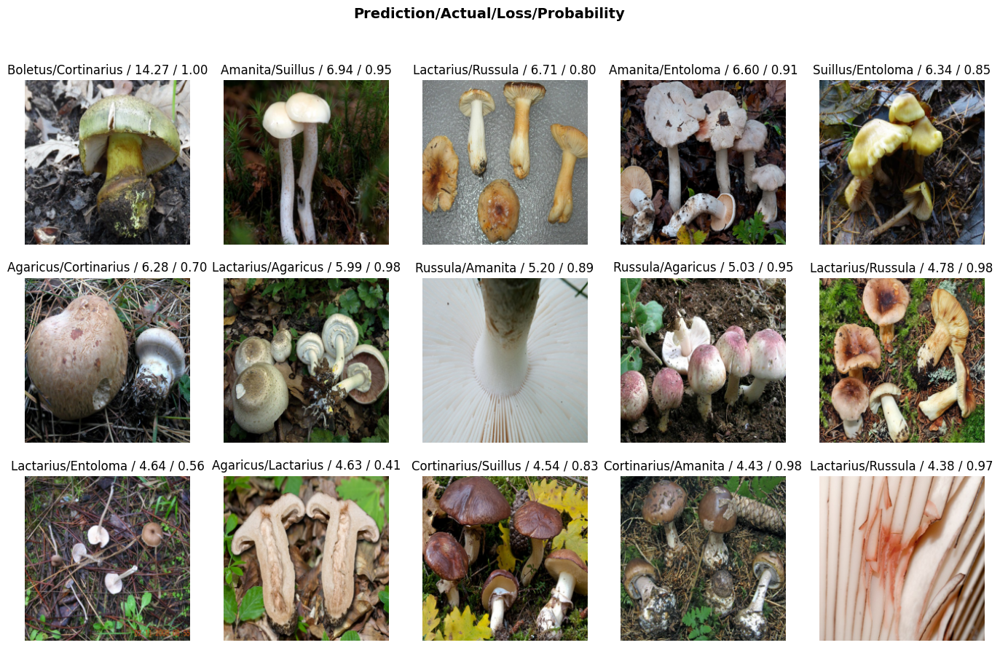

In [32]:
interp.plot_top_losses(15,figsize=(17,10))

In [33]:
interp.print_classification_report()

              precision    recall  f1-score   support

    Agaricus       0.72      0.77      0.75        53
     Amanita       0.89      0.88      0.88       113
     Boletus       0.94      0.95      0.94       161
 Cortinarius       0.81      0.78      0.80       125
    Entoloma       0.87      0.75      0.80        55
   Hygrocybe       0.91      0.85      0.88        47
   Lactarius       0.85      0.87      0.86       235
     Russula       0.79      0.86      0.82       172
     Suillus       0.85      0.70      0.77        47

    accuracy                           0.85      1008
   macro avg       0.85      0.82      0.83      1008
weighted avg       0.85      0.85      0.85      1008



In [34]:
convnext_tiny_hnf = vision_learner(dls, 'convnext_tiny_hnf', metrics=error_rate)

convnext_tiny_hnf.fine_tune(5)

model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.769580,1.029020,0.308532,00:58


epoch,train_loss,valid_loss,error_rate,time
0,1.136015,0.751936,0.238095,01:37
1,0.884901,0.581178,0.191468,01:36
2,0.648630,0.456029,0.164683,01:36
3,0.510007,0.403418,0.138889,01:35
4,0.425634,0.393152,0.139881,01:35


In [35]:
convnext_tiny_hnf = vision_learner(dls, 'convnext_tiny_hnf', metrics=error_rate).to_fp16()

convnext_tiny_hnf.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,1.791376,1.016628,0.327381,00:30


epoch,train_loss,valid_loss,error_rate,time
0,1.086643,0.743088,0.255952,00:38
1,0.868737,0.578212,0.195437,00:38
2,0.657601,0.456023,0.160714,00:38
3,0.485601,0.429818,0.138889,00:38
4,0.421935,0.423052,0.134921,00:38


In [36]:
convnext_tiny_in22k = vision_learner(dls, 'convnext_tiny_in22k', metrics=error_rate).to_fp16()

convnext_tiny_in22k.fine_tune(5)

/opt/conda/lib/python3.10/site-packages/timm/models/_factory.py:117: UserWarning: Mapping deprecated model name convnext_tiny_in22k to current convnext_tiny.fb_in22k.
  model = create_fn(


model.safetensors:   0%|          | 0.00/178M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.044175,0.365857,0.119048,00:31


epoch,train_loss,valid_loss,error_rate,time
0,0.469640,0.282598,0.095238,00:37
1,0.408004,0.237308,0.081349,00:37
2,0.318347,0.206213,0.067460,00:36
3,0.239437,0.190485,0.059524,00:36
4,0.230560,0.187704,0.064484,00:37


SuggestedLRs(minimum=6.309573450380412e-08, steep=5.754399353463668e-06, valley=1.737800812406931e-05, slide=3.0199516913853586e-05)

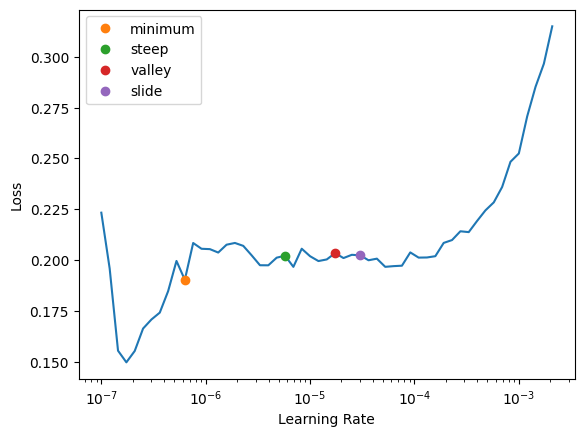

In [37]:
convnext_tiny_in22k.lr_find(suggest_funcs=(minimum,steep,valley,slide))

In [38]:
interp2= ClassificationInterpretation.from_learner(convnext_tiny_in22k)

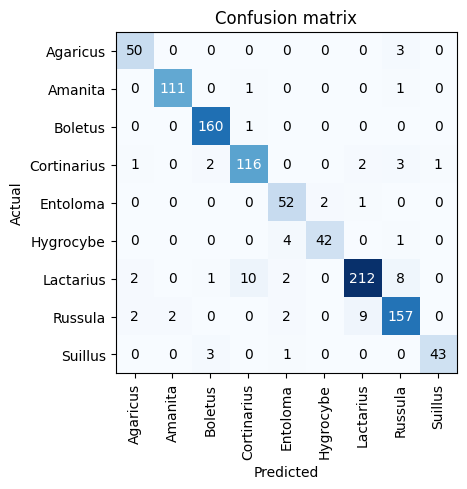

In [39]:
interp2.plot_confusion_matrix()

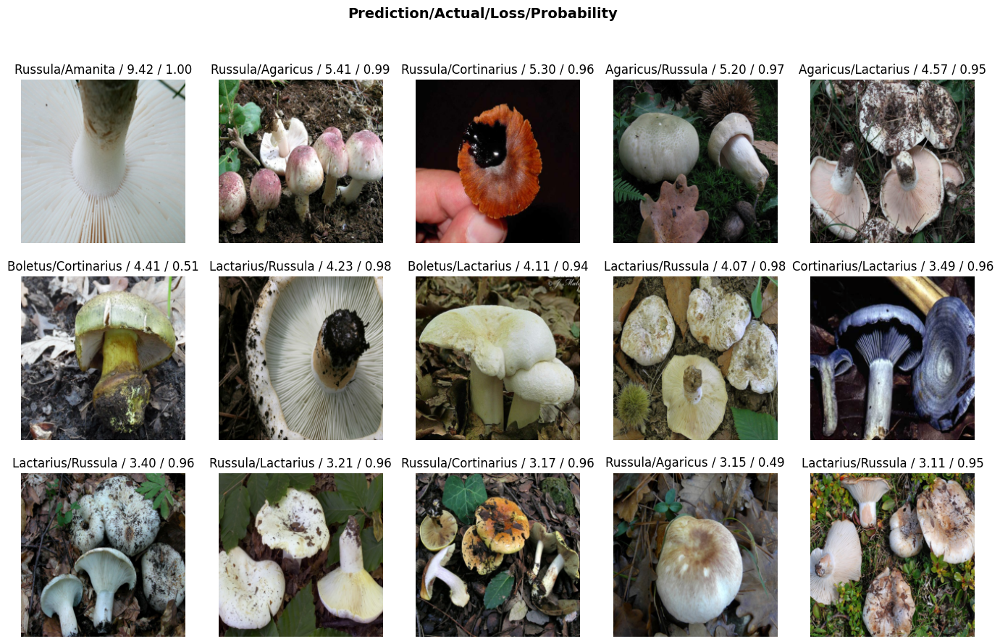

In [40]:
interp2.plot_top_losses(15,figsize=(17,10))

In [41]:
interp2.most_confused()

[('Lactarius', 'Cortinarius', 10),
 ('Russula', 'Lactarius', 9),
 ('Lactarius', 'Russula', 8),
 ('Hygrocybe', 'Entoloma', 4),
 ('Agaricus', 'Russula', 3),
 ('Cortinarius', 'Russula', 3),
 ('Suillus', 'Boletus', 3),
 ('Cortinarius', 'Boletus', 2),
 ('Cortinarius', 'Lactarius', 2),
 ('Entoloma', 'Hygrocybe', 2),
 ('Lactarius', 'Agaricus', 2),
 ('Lactarius', 'Entoloma', 2),
 ('Russula', 'Agaricus', 2),
 ('Russula', 'Amanita', 2),
 ('Russula', 'Entoloma', 2),
 ('Amanita', 'Cortinarius', 1),
 ('Amanita', 'Russula', 1),
 ('Boletus', 'Cortinarius', 1),
 ('Cortinarius', 'Agaricus', 1),
 ('Cortinarius', 'Suillus', 1),
 ('Entoloma', 'Lactarius', 1),
 ('Hygrocybe', 'Russula', 1),
 ('Lactarius', 'Boletus', 1),
 ('Suillus', 'Entoloma', 1)]

In [42]:
cleaner = ImageClassifierCleaner(convnext_tiny_in22k)

In [43]:
cleaner